# Tratamiento de imágenes  2023 - Entregable 1
# Fecha de entrega: 12/04/2023

**Importante:** En todos los ejercicios se espera que se entregue comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en celdas de texto agregadas a los notebooks o en un informe aparte.

Para la entrega se sube un **zip** (no rar, ni otro formato) con:
* El notebook del entregable modificado. El notebook debe tener las celdas ejecutadas con las salidas correspondientes. Debe tener todo lo necesario para poder ser ejecutado nuevamente
* Todo el resto del contenido del zip del entregable. Si, para mostrar resultados, usan en el notebook imágenes propias, deben incluirlas en la carpeta **imagenes**  del zip. 
* El informe en pdf en caso de no incluir las discusiones dentro del notebook en celdas "Markdown", o si les resulta más sencillo realizar el análisis en un documento aparte.

No se deben incluir en el zip de la entrega las imágenes de prueba que están disponibles en la página web del curso. Se asumirá que esas imágenes están en un directorio y se hará referencia a dichas imágenes en forma relativa a ese directorio (ver la celda siguiente).
   

In [28]:
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread
import time
from scipy.signal import correlate2d
from matplotlib import patches
import scipy.fftpack as fp
from matplotlib import patches
from skimage import  restoration
import random
import cv2 #opencv

from scipy.fftpack import fft2, ifft2, fftshift
from scipy.ndimage import convolve
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error
from skimage.restoration import denoise_nl_means

import warnings
warnings.simplefilter("ignore")

In [40]:
dir_base="imagenes/"

## 1) Líneas de nivel

Escribir un programa que reciba una imagen y un conjunto de valores y muestre las líneas de nivel correspondientes a dichos valores. Para ello implementar el algoritmo marching squares (Ver por ejemplo: https://en.wikipedia.org/wiki/Marching_squares).

Aplicarlo a imágenes naturales y artificiales y comparar los resultados con los de la función contour (https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html). 

Imágenes artificiales sugeridas: cono.png, pliegues.png, oclusion.png


In [41]:
def imprimir_segmentos(lista):
    for segmento in lista:
        if segmento:
            x1,y1=segmento[0]
            x2,y2=segmento[1]
            plt.plot([x1,x2],[y1,y2],"b-")

def caso_a(square, nivel, col, fila):
    a=square[0,0]
    b=square[1,0]
    x=np.abs((nivel-a)/(b-a))
    punto=[col-0.5,fila+x]
    return(punto)

def caso_b(square, nivel, col, fila):
    a=square[1,0]
    b=square[1,1]
    x=np.abs((nivel-a)/(b-a))
    punto=[col+x,fila+1.5]
    return(punto)

def caso_c(square, nivel, col, fila):
    a=square[0,1]
    b=square[1,1]

    x=np.abs((nivel-a)/(b-a))
    punto=[col+1.5,fila+x]
    return(punto)

def caso_d(square, nivel, col, fila):
    
    a=square[0,0]
    b=square[0,1]
    x=np.abs((nivel-a)/(b-a))
    punto=[col+x,fila-0.5]
    return(punto)
   
def lineas_nivel(img, levels):
    """
    Genera líneas de nivel de una imagen dada. 
    Muestra las líneas de nivel sobre la figura que se encuentre activa 

    Args:
        img (array 2D): Imagen de entrada.
        levels (list): Lista de niveles.

    Returns:
        None
    """
    
    height, width = np.shape(img)
    for nivel in levels:
        matriz_umbral=(img>nivel)
        segmento=[]
        for fila in range(0,height-1):
            #print(fila)
            for col in range(0,width-1):
                #print(col)
                segmentito=[]
                segmentito2=[]
                square = img[fila:fila+2, col:col+2]
                #print(square)
                square_umbral=matriz_umbral[fila:fila+2, col:col+2]
                if (square_umbral[0,0] and square_umbral[0,1] and square_umbral[1,0] and square_umbral[1,1]):
                    #print("caso 0")
                    pass
                elif square_umbral[0,0] and square_umbral[0,1] and not square_umbral[1,0] and square_umbral[1,1]:                    
                    #print("caso 1")
                    punto0=caso_a(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif square_umbral[0,0] and square_umbral[0,1] and square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 2")
                    punto0=caso_c(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif square_umbral[0,0] and square_umbral[0,1] and not square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 3")
                    punto0=caso_a(square, nivel, col, fila)
                    punto1=caso_c(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif square_umbral[0,0] and not square_umbral[0,1] and square_umbral[1,0] and square_umbral[1,1]:
                    #print("caso 4")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_c(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif square_umbral[0,0] and not square_umbral[0,1] and not square_umbral[1,0] and square_umbral[1,1]:
                    #print("caso 5")
                    punto0=caso_c(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    
                    punto2=caso_a(square, nivel, col, fila)
                    punto3=caso_d(square, nivel, col, fila)
                    segmentito2.append(punto2)
                    segmentito2.append(punto3)
                    pass
                elif square_umbral[0,0] and not square_umbral[0,1] and square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 6")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif square_umbral[0,0] and not square_umbral[0,1] and not square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 7")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_a(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                elif not square_umbral[0,0] and square_umbral[0,1] and square_umbral[1,0] and square_umbral[1,1]:
                    #print("caso 8")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_a(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    pass
                elif not square_umbral[0,0] and square_umbral[0,1] and not square_umbral[1,0] and square_umbral[1,1]:
                    #print("caso 9")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)

                    segmentito.append(punto0)
                    segmentito.append(punto1)
                    
                    pass
                elif not square_umbral[0,0] and square_umbral[0,1] and square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 10")
                    punto0=caso_c(square, nivel, col, fila)
                    punto1=caso_d(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1) 
                    punto2=caso_a(square, nivel, col, fila)
                    punto3=caso_b(square, nivel, col, fila)
                    segmentito2.append(punto2)
                    segmentito2.append(punto3)
                elif not square_umbral[0,0] and square_umbral[0,1] and  not square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 11")
                    punto0=caso_d(square, nivel, col, fila)
                    punto1=caso_c(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                elif not square_umbral[0,0] and  not square_umbral[0,1] and  square_umbral[1,0] and  square_umbral[1,1]:
                    #print("caso 12")
                    punto0=caso_a(square, nivel, col, fila)
                    punto1=caso_c(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                elif not square_umbral[0,0] and  not square_umbral[0,1] and not square_umbral[1,0] and square_umbral[1,1]:
                    #print("caso 13")
                    punto0=caso_c(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                elif not square_umbral[0,0] and  not square_umbral[0,1] and  square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 14")
                    punto0=caso_a(square, nivel, col, fila)
                    punto1=caso_b(square, nivel, col, fila)
                    segmentito.append(punto0)
                    segmentito.append(punto1)
                elif not square_umbral[0,0] and  not square_umbral[0,1] and not square_umbral[1,0] and not square_umbral[1,1]:
                    #print("caso 15")
                    pass
                if segmentito:
                    segmento.append(segmentito)
                if segmentito2:
                    segmento.append(segmentito2)
                
        imprimir_segmentos(segmento)

def ploteo_curvas_nivel(I,levels):
    """Ploteo la comparación de las curvas de nivel

    Args:
        I (img): imagen a plotear
        levels (list): lista de niveles
    """
    fig, axs = plt.subplots(1,2,figsize=(10,4))

    axs[0].imshow(I, cmap='gray')
    axs[0].contour(I, levels=levels,colors=["red"])
    axs[0].set_axis_off()

    axs[1].imshow(I, cmap='gray')
    lineas_nivel(I, levels=levels)
    axs[0].set_title("Contour")
    axs[1].set_title("Función implementada")
    axs[1].set_axis_off()


    fig.suptitle('Comparación')
    

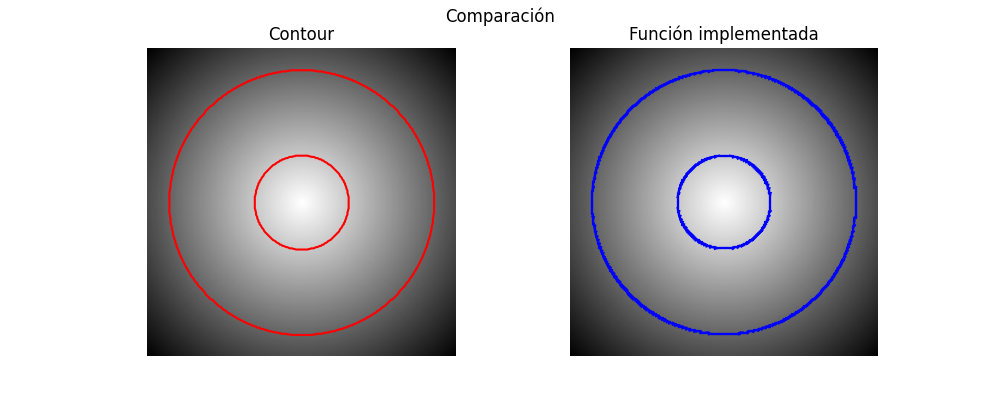

In [42]:

I = imread(dir_base+'cono.png')
if I.ndim>2:
    I = I[:,:,0]
ploteo_curvas_nivel(I,[100,200])


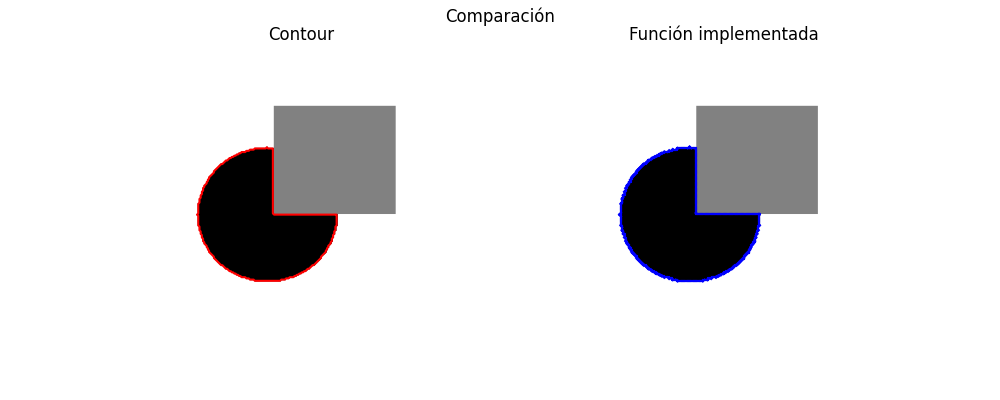

In [43]:
I = imread(dir_base+'oclusion.bmp')
if I.ndim>2:
    I = I[:,:,0]
ploteo_curvas_nivel(I,[128])


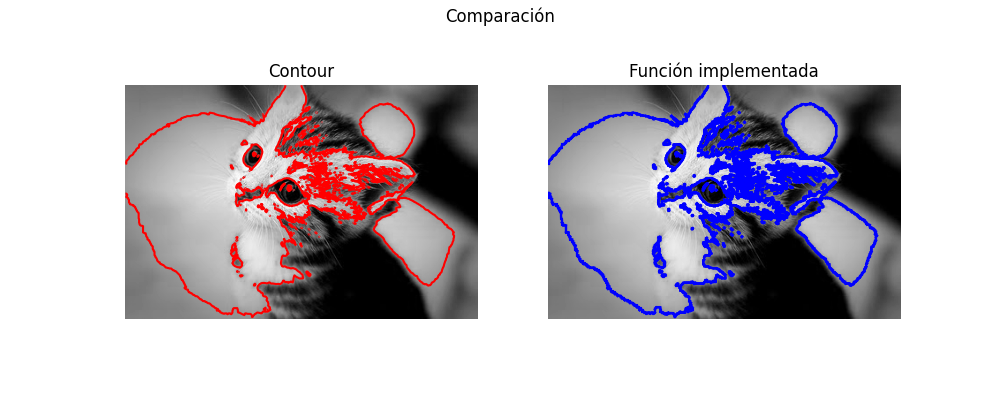

In [44]:
I = imread(dir_base+'kitten.jpg')
if I.ndim>2:
    I = I[:,:,0]
ploteo_curvas_nivel(I,[150])

## 2) Histograma

Imágenes sugeridas: parot1.png, parot2.png, strike1.png, strike2.png

**a)** Implementar una función que calcule el histograma e histograma acumulado de una imagen. Mostrar resultados para las imágenes parot1.png y parot2.png con diverso número de bins (bins=10, bins=100, bins=256). 

In [45]:
def histograma(img, bins, rango=None):    
    """
    Calcula el histograma de una imagen. 
    Devuelve el histograma y los bins correspondientes.
    
    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no 
                                        se pasa, se toma el mínimo y máximo de la imagen   

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados para calcular el histograma.
    """
    
    counts = np.zeros(bins)
    bin_edges=np.zeros(bins+1)
    if not rango:
        rango=(np.min(img),np.max(img))
    bin_edges[0]=rango[0]

    cantidad_pixels=rango[1]-rango[0]+1
    for i in range(rango[0],rango[1]+1):
        bin=int((i-rango[0])*bins/cantidad_pixels)

        count = np.count_nonzero(img == i)
        counts[bin]=count+counts[bin]
        bin_edges[bin+1]=i

        
    return counts, bin_edges

def histogramaAcumulado(img, bins, range=None):
    """
    Calcula el histograma acumulado de una imagen. 
    Devuelve el histograma acumulado y los bins correspondientes.

    Args:
        imagen (ndarray): La imagen de entrada.
        bins (int): El número de bins a utilizar.
        range (float, float), opcional. Rango mínimo y máximo para los bins. Si no 
                                        se pasa, se toma el mínimo y máximo de la imagen

    Returns:
        counts (1D-array de largo bins): Cantidad de muestras acumuladas en cada bin
        bin_edges (1D-array de largo bins +1): Los bordes de los bins utilizados.
    """

    counts, bin_edges=histograma(img,bins,range)
    counts = np.cumsum(counts)
    
    return counts, bin_edges

**b)** Comparar los histogramas con la salida de la función *histogram()* de numpy para las mismas imágenes y mismos bins.

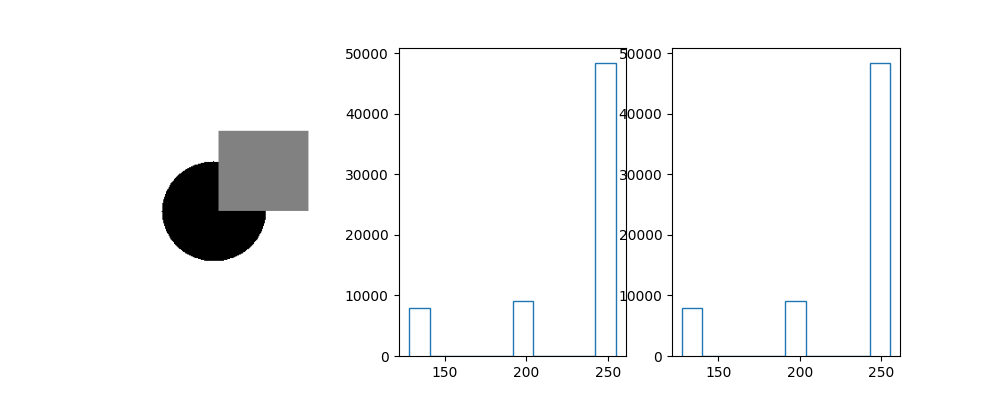

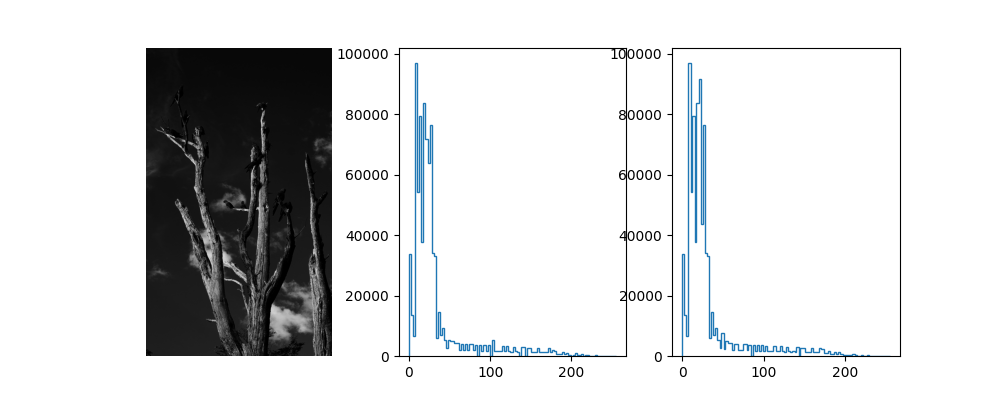

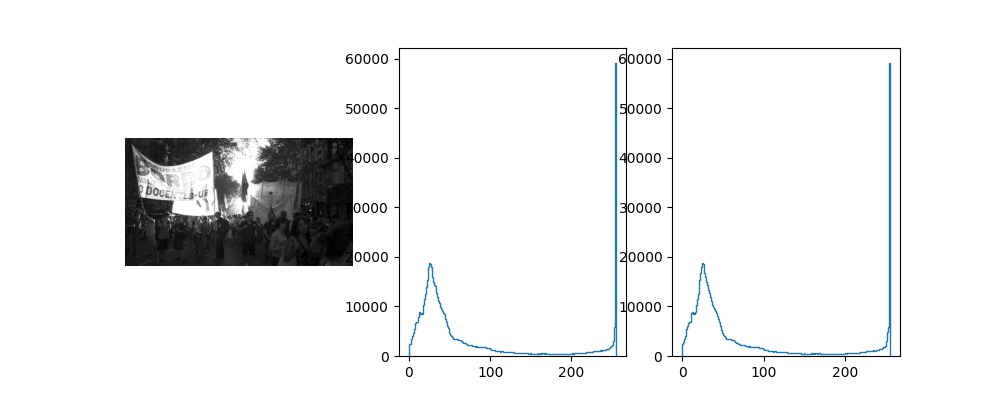

In [46]:
I = imread(dir_base+'oclusion.bmp')
if I.ndim>2:
    I = I[:,:,0]
fig, axs = plt.subplots(1,3,figsize=(10,4))
axs[0].imshow(I, cmap='gray')
axs[0].set_axis_off()
counts, bin_edges = np.histogram(I.flatten(), 10)
axs[1].stairs(counts, bin_edges)
counts, bin_edges = histograma(I.flatten(), 10)
axs[2].stairs(counts, bin_edges)





I = imread(dir_base+'parot1.png')
if I.ndim>2:
    I = I[:,:,0]
fig, axs = plt.subplots(1,3,figsize=(10,4))
axs[0].imshow(I, cmap='gray')
axs[0].set_axis_off()
counts, bin_edges = np.histogram(I.flatten(), 100)
axs[1].stairs(counts, bin_edges)
counts, bin_edges = histograma(I.flatten(), 100)
axs[2].stairs(counts, bin_edges)



I = imread(dir_base+'strike2.png')
if I.ndim>2:
    I = I[:,:,0]
fig, axs = plt.subplots(1,3,figsize=(10,4))
axs[0].imshow(I, cmap='gray')
axs[0].set_axis_off()
counts, bin_edges = np.histogram(I.flatten(), 256)
axs[1].stairs(counts, bin_edges)
counts, bin_edges = histograma(I.flatten(), 256)
axs[2].stairs(counts, bin_edges)


**c)** Calcular el histograma de la imagen ct_dcm.tif (imagen de 16 bits).  

Desplegar la imagen   

Buscar información sobre **ventana/nivel** (*Window/Level*) y explicar por qué tiene sentido usar este mecanismo para visualizar imágenes de tomografía computada. 

Las imágenes de tomografía computada tienen un rango de valores de píxeles muy amplio. Ventana se refiere al rango de valores de intensidad que se muestran en la imagen y nivel el valor medio de intensidad. El mécanismo ventana/nivel sirve para ajustar el rango de valores de píxeles mostrados en la imagen.

En este caso serviría para resaltar los valores altos en la zona de la boca o los valores medios para resaltar el resto de los huesos.

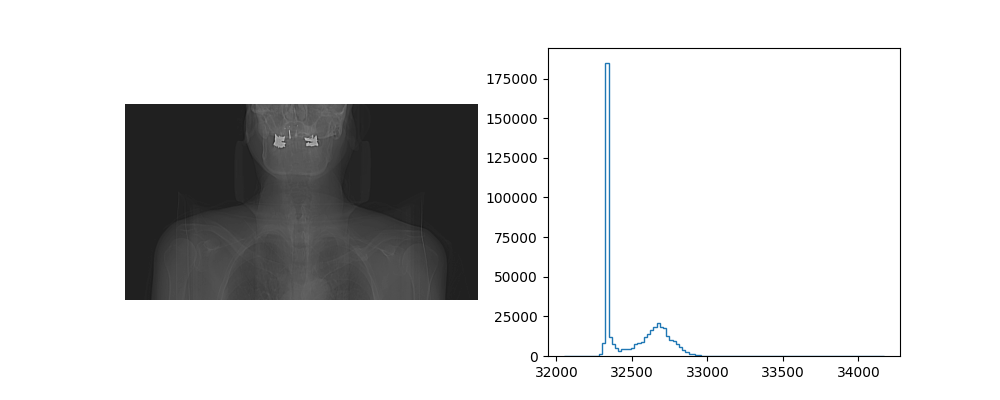

In [49]:
I = imread(dir_base+'ct_dcm.tif')
if I.ndim>2:
    I = I[:,:,0]

fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].imshow(I, cmap='gray')
axs[0].set_axis_off()

counts, bin_edges = histograma(I.flatten(), 100)

axs[1].stairs(counts, bin_edges)



En la siguiente imagen se intentó resaltar más los huesos para que se pueda ver más la clavícula viendo los valores del histograma.

32049


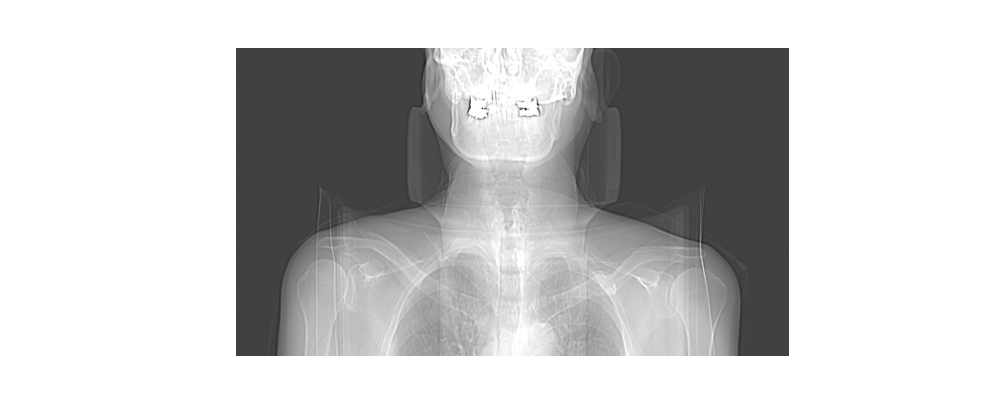

In [50]:
import numpy as np
import matplotlib.pyplot as plt

I = imread(dir_base+'ct_dcm.tif')
if I.ndim>2:
    I = I[:,:,0]
print(np.min(I))

# Ajustar la ventana/nivel
window_center = 32500
window_width = 700
min_value = window_center - (window_width / 2.0)
max_value = window_center + (window_width / 2.0)
output_image = np.clip(I, min_value, max_value)

# Normalizar la imagen
output_image = (output_image - min_value) / window_width


fig, axs = plt.subplots(1,1,figsize=(10,4))

axs.imshow(output_image, cmap='gray')
axs.set_axis_off()


**d)** Implementar una función que realice el matching de histogramas entre un par de imágenes. 

(Ver por ejemplo: http://paulbourke.net/miscellaneous/equalisation/ y https://en.wikipedia.org/wiki/Histogram_matching )

(Artículo interesante que hace algo levemente diferente a lo que se pide en este ejercicio: https://www.ipol.im/pub/art/2016/140/)



In [51]:
def find_closest_number_index(numbers_list, target):
    closest_index = None
    min_difference = float('inf')
    for i, number in enumerate(numbers_list):
        difference = abs(number - target)
        if difference < min_difference:
            min_difference = difference
            closest_index = i
    return closest_index

def normalizar_hist(histograma):
    X_min_ac = min(histograma)
    X_max_ac = max(histograma)
    histograma_norm = [int((x - X_min_ac) * (255 / (X_max_ac - X_min_ac))) for x in histograma]
    return(histograma_norm)

## Devuelve una imagen, la cual corresponde a ajustar el histograma de img al histograma de la imagen de referencia img_base
def matching(img, img_base):
    """
    Matching de histograma de una imagen con una imagen de referencia.

    Args:
        img (ndarray): La imagen de entrada.
        img_base (ndarray): La imagen de referencia.

    Returns:
        img_match (ndarray): La imagen con el histograma matcheado al de referencia
    
    """
    histograma_acumulado, bin_edges = histogramaAcumulado(img.flatten(), 256, (0,255))
    histograma_acumulado_base, bin_edges = histogramaAcumulado(img_base.flatten(), 256, (0,255))
    histograma_acumulado=normalizar_hist(histograma_acumulado)
    histograma_acumulado_base=normalizar_hist(histograma_acumulado_base)



    lut=[]
    for valor in histograma_acumulado:
        index=find_closest_number_index(histograma_acumulado_base,valor)
        lut.append(index)
    img_match=np.zeros(np.shape(img))


    for i in range(np.shape(img)[0]):
        for j in range(np.shape(img)[1]):
        
            valor=img[i,j]
            #print(valor)
            
            img_match[i,j]=lut[valor]    
    return img_match

In [52]:
def plotear_histogramas(img):

    histrograma, bins_hist= histograma(img, 256,(0,255))
    histograma_ac, bins_hist_ac=histogramaAcumulado(img, 256,(0,255))


    fig, axs = plt.subplots(1,3,figsize=(10,4))


    axs[0].stairs( histrograma, bins_hist)
    axs[1].stairs( histograma_ac, bins_hist_ac)
    axs[2].imshow(img,cmap="gray")

    axs[0].set_title("Histograma")
    axs[1].set_title("Histograma acumulado")
    axs[2].set_title("Imagen")


**e)** Aplique el matching de histogramas entre dos imágenes (por ejemplo entre parot1.png y parot2.png y/o entre strike1.png y strike2.png). 

Muestre y analice los resultados.

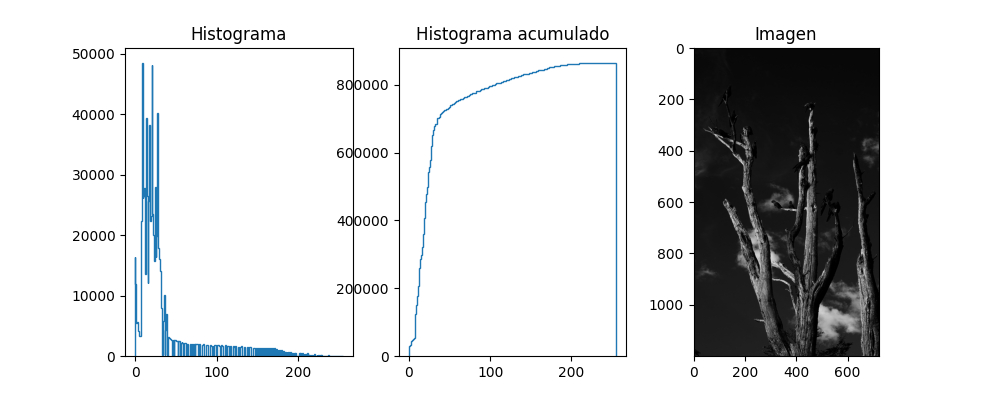

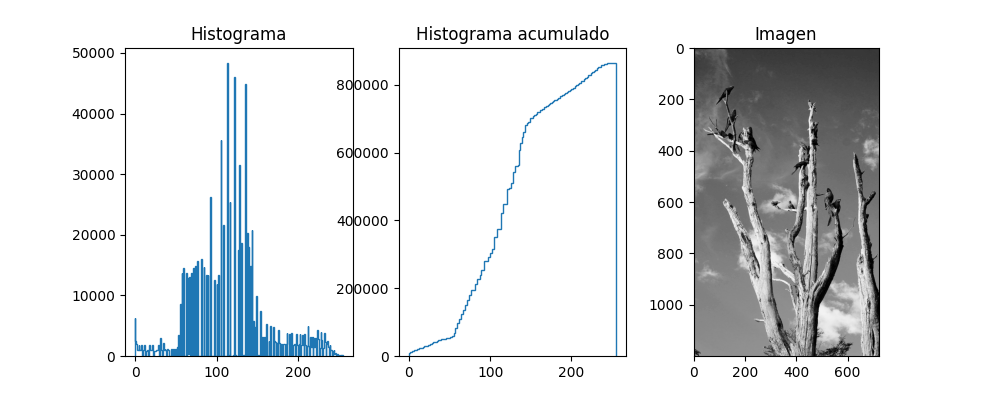

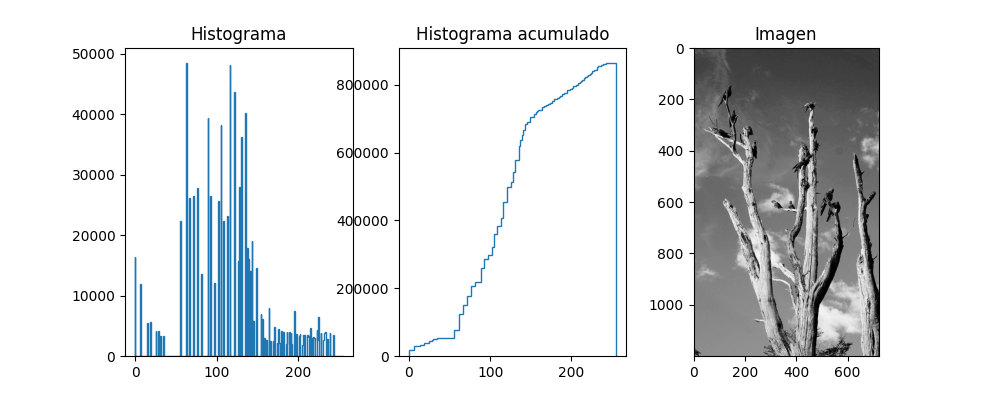

In [53]:
imagen = imread(dir_base+'parot1.png')
if imagen.ndim>2:
    imagen = imagen[:,:,0]
imagen_base = imread(dir_base+'parot2.png')
if imagen_base.ndim>2:
    imagen_base = imagen_base[:,:,0]

img_matching=matching(imagen, imagen_base)

plotear_histogramas(imagen)
plotear_histogramas(imagen_base)
plotear_histogramas(img_matching)




Vemos en este caso que toma el histograma de la imagen más clara para aclarar la imagen oscura. Los histogramas no quedan exactamente iguales pero bastante parecidos

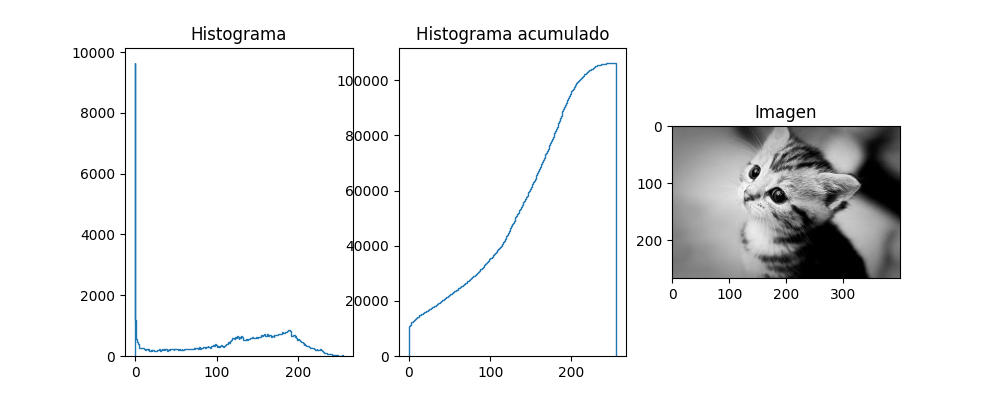

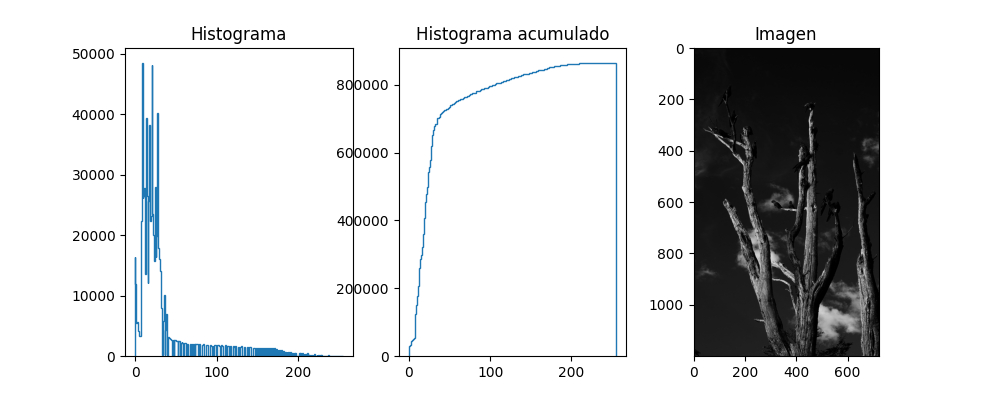

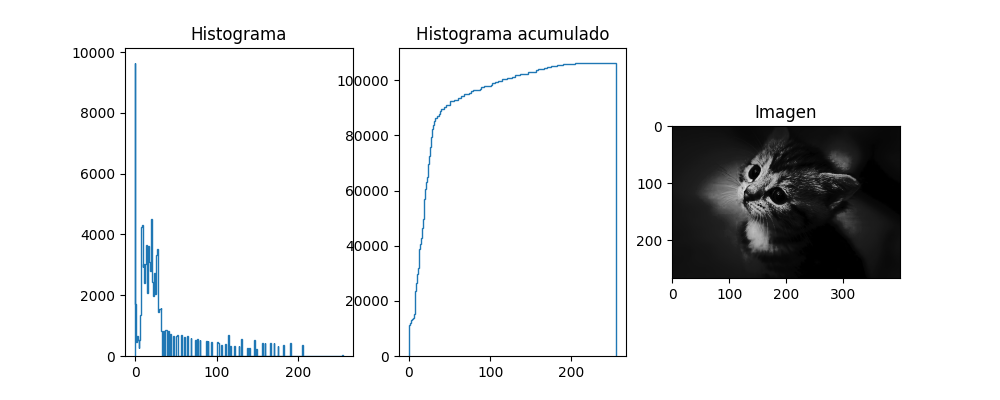

In [54]:
imagen = imread(dir_base+'kitten.jpg')
if imagen.ndim>2:
    imagen = imagen[:,:,0]
imagen_base = imread(dir_base+'parot1.png')
if imagen_base.ndim>2:
    imagen_base = imagen_base[:,:,0]

img_matching=matching(imagen, imagen_base)

plotear_histogramas(imagen)
plotear_histogramas(imagen_base)
plotear_histogramas(img_matching)

En este ejemplo se prueba oscurecer la imagen del gatito.

##  3) Restauración de imágenes con ruido

**a) A partir de una imagen original, generar imágenes con diferentes niveles de ruido gaussiano (por ejemplo σ=5, 10, 20, 40) y ruido “sal y pimienta” (por ejemplo p=0.1, 0.3, 0.5, 0.8).**

Imágenes sugeridas: lena.bmp, peppers.png, baboon.png, (pasadas a gris en caso que estén en colores)   
Otras [imágenes estándar](http://en.wikipedia.org/wiki/Standard_test_image) se pueden encontrar en http://sipi.usc.edu/database/database.php?volume=misc    

**b) Procesar las imágenes de (a) con**
* filtros de media de diverso tamaño (implementar)
* filtros de mediana de diverso tamaño (implementar)
* Non local means (usar implementación de OpenCV y/o de scikit-image)

**c) Cuantificar la reducción de ruido utilizando medidas adecuadas (PSNR, RMSE).**  
Indicar cuáles de los algoritmos son adecuados para cada tipo de ruido.

Las métricas a usar pueden encontrarse en [skimage.metrics ](https://scikit-image.org/docs/stable/api/skimage.metrics.html)

**Nota:** En caso que lo deseen, la parte de cuantificación puede realizarse en Fiji mediante el plugin SNR como se muestra en el video de Restauración.  
Para eso, se puede guardar las imágenes originales, ruidosas y restauradas generadas en el notebook y luego procesarlas con Fiji.  
El plugin se encuentra disponible en http://bigwww.epfl.ch/sage/soft/snr/.
También se encuentra como ejemplo el macro *Macro_noise.ijm* para generar las imagenes ruidosas y la restauración.

Si se sigue este último camino, comparar con el resultado de skimage.metrics para alguna restauración hecha.


**Para el caso de Non local means se utilizó la implementación de scikit-image. Se varió el parámetro h, que refiere a la distancia de corte donde define una ventana y se buscarán pixeles similares en la ventana para suavizar la imagen. Si hay más ruido se utiliza un valor de h mayor. Según la descripción de la función en la documentación se utiliza un valor un poco menor al sigma estimado del ruido de la imagen.**

In [55]:
def add_gaussian_noise(I,sigma):
    """
    Contaminar imagen con ruido Gaussiano de desviación estándar sigma.

    Args:
        I (ndarray): La imagen de entrada.
        sigma (float): Desviación estándar del ruido.

    Returns:
        J (ndarray): La imagen contaminada con ruido Gaussiano de desviación estándar sigma
    
    """
    shape=np.shape(I)
    gaussian = np.random.normal(0, sigma, shape)
    J=I+gaussian


    return J

def add_saltpepper_noise(I,p):
    """
    Contaminar imagen con ruido sal y pimienta. Cada pixel tiene probabilidad p de ser contaminado.
    Se asume que, dado un pixel contaminado, la asignación de 0 o 255 (pepper y salt, respectivamente) es equiprobale.

    Args:
        I (ndarray): La imagen de entrada.
        p (float): Probabilidad de que un pixel sea contaminado.

    Returns:
        J (ndarray): La imagen contaminada con ruido sal y pimienta
    
    """
     
    J=I.copy()
    opciones = [0, 1,2]
    pesos = [1-p, p/2,p/2]
    for i in range(np.shape(I)[0]):
        for j in range(np.shape(I)[1]):
            resultado = random.choices(opciones, pesos,k=1)
            if resultado[0]==1:
                #pepper
                J[i,j]=0
            elif resultado[0]==2:
                #salt
                J[i,j]=255
    
    return J

Text(0.5, 1.0, 'Imagen con ruido gaussiano $\\sigma$=40')

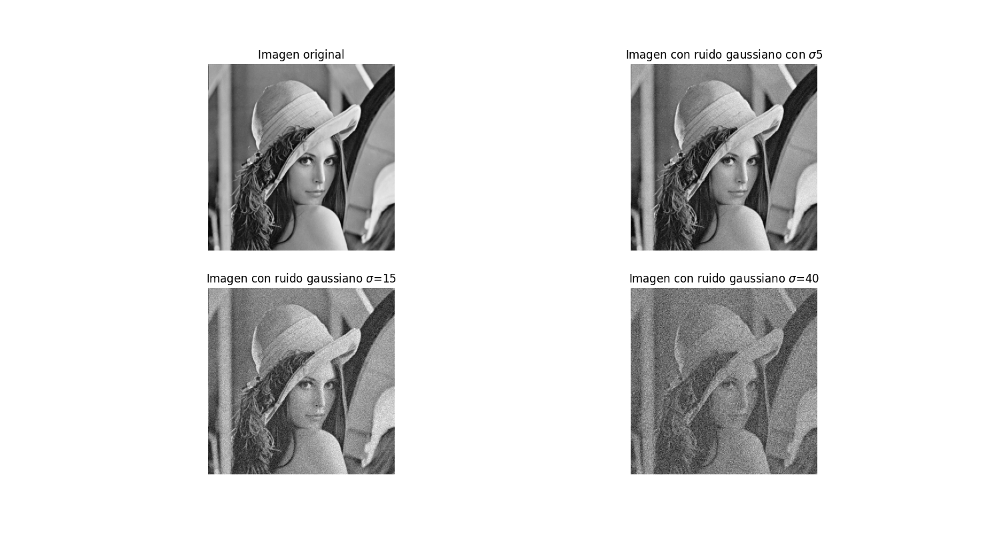

In [56]:
imagen = imread(dir_base+'lena.bmp')
if imagen.ndim>2:
    imagen = imagen[:,:,0]

fig, axs = plt.subplots(2,2,figsize=(15,8))

axs[0,0].imshow(imagen, cmap='gray')
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(add_gaussian_noise(imagen,5), cmap='gray')
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido gaussiano con $\sigma$5")

axs[1,0].imshow(add_gaussian_noise(imagen,15), cmap='gray')
axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen con ruido gaussiano $\sigma$=15")

axs[1,1].imshow(add_gaussian_noise(imagen,40), cmap='gray')
axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen con ruido gaussiano $\sigma$=40")



Text(0.5, 1.0, 'Imagen con ruido sal y pimienta p=0.5')

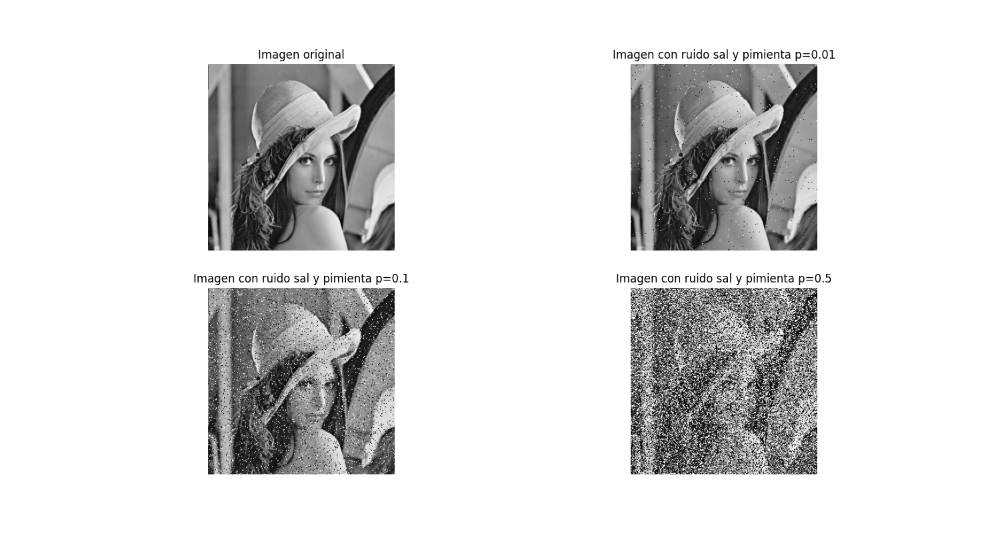

In [57]:
imagen = imread(dir_base+'lena.bmp')
if imagen.ndim>2:
    imagen = imagen[:,:,0]

fig, axs = plt.subplots(2,2,figsize=(15,8))

axs[0,0].imshow(imagen, cmap='gray')
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(add_saltpepper_noise(imagen,0.01), cmap='gray')
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido sal y pimienta p=0.01")

axs[1,0].imshow(add_saltpepper_noise(imagen,0.1), cmap='gray')
axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen con ruido sal y pimienta p=0.1")

axs[1,1].imshow(add_saltpepper_noise(imagen,0.5), cmap='gray')
axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen con ruido sal y pimienta p=0.5")

In [58]:
def meanFilter(I, filterSize):
    """filtro de media

    Args:
        I (img): la imagen
        filterSize (int):radio (tiene que ser impar)

    Returns:
        img: la imagen filtrada
    """
    I= np.pad(I,filterSize,'reflect')

    J=I.copy()
    height, width = np.shape(I)
    for fila in range(0,height-filterSize*2+1):
            for col in range(0,width-filterSize*2+1):
                square = I[fila:fila+filterSize*2+1, col:col+filterSize*2+1]
                mean=int(np.mean(square))
                J[fila,col]=mean
                
    return(J[filterSize:-filterSize,filterSize:-filterSize])

def medianFilter(I, filterSize):
    
    """filtro de mediana

    Args:
        I (img): la imagen
        filterSize (int):radio (tiene que ser impar)

    Returns:
        img: la imagen filtrada
    """
    I= np.pad(I,filterSize,'reflect')

    J=I.copy()
    height, width = np.shape(I)
    for fila in range(0,height-filterSize*2+1):
            for col in range(0,width-filterSize*2+1):
                square = I[fila:fila+filterSize*2+1, col:col+filterSize*2+1]
                mean=int(np.median(square))
                J[fila,col]=mean
                
    return(J[filterSize:-filterSize,filterSize:-filterSize])

#### Ruido gaussiano

Se prueba con $\sigma=40$ y $\sigma=10$. En ambos casos se obtienen los mejores resultados con el filtro non local means ($h=30$ y$h=8$ respectivamente). Tambien se obtienen buenos resultados con el filtro de media con $r=1$ para el caso de $\sigma=40$. 

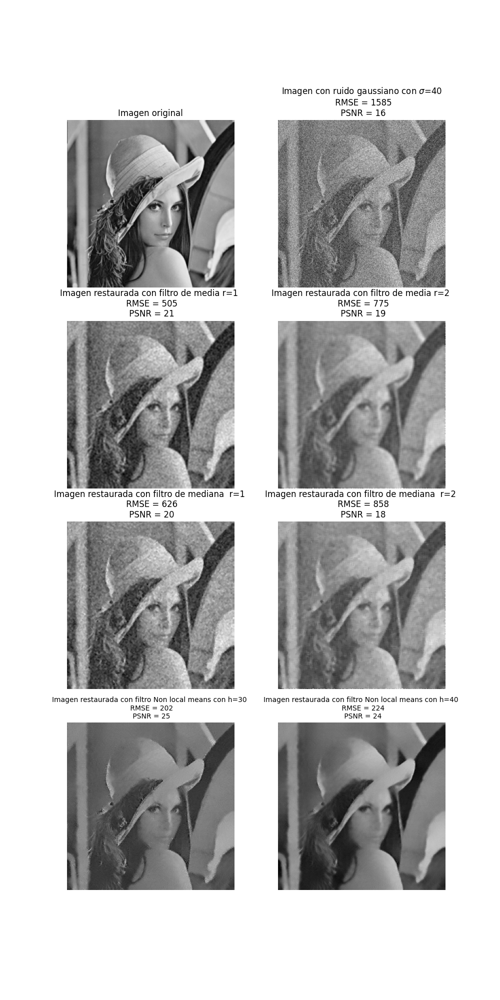

In [59]:
J=add_gaussian_noise(imagen,40)
K1=meanFilter(J, 1)
K2=meanFilter(J, 2)


L1=medianFilter(J, 1)
L2=medianFilter(J, 2)


M1=denoise_nl_means(J,h=30)
M2=denoise_nl_means(J,h=40)


fig, axs = plt.subplots(4,2,figsize=(10,20))

axs[0,0].imshow(imagen,cmap="gray")
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(J,cmap="gray")
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido gaussiano con $\sigma$=40 \n RMSE = "+str(int(mean_squared_error(imagen,J))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, J))))


axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen restaurada con filtro de media r=1 \n RMSE = "+str(int(mean_squared_error(imagen,K1))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K1))))
axs[1,0].imshow(K1,cmap="gray")

axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen restaurada con filtro de media r=2 \n RMSE = "+str(int(mean_squared_error(imagen,K2))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K2))))
axs[1,1].imshow(K2,cmap="gray")

axs[2,0].set_axis_off()
axs[2,0].set_title("Imagen restaurada con filtro de mediana  r=1 \n RMSE = "+str(int(mean_squared_error(imagen,L1))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L1))))
axs[2,0].imshow(L1,cmap="gray")

axs[2,1].set_axis_off()
axs[2,1].set_title("Imagen restaurada con filtro de mediana  r=2 \n RMSE = "+str(int(mean_squared_error(imagen,L2))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L2))))
axs[2,1].imshow(L2,cmap="gray")

axs[3,0].set_axis_off()
axs[3,0].set_title("Imagen restaurada con filtro Non local means con h=30 \n RMSE = "+str(int(mean_squared_error(imagen,M1))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M1))),fontsize=10)
axs[3,0].imshow(M1,cmap="gray")

axs[3,1].set_axis_off()
axs[3,1].set_title("Imagen restaurada con filtro Non local means con h=40 \n RMSE = "+str(int(mean_squared_error(imagen,M2))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M2))),fontsize=10)
axs[3,1].imshow(M2,cmap="gray")



In [ ]:
J=add_gaussian_noise(imagen,10)
K1=meanFilter(J, 1)
K2=meanFilter(J, 2)


L1=medianFilter(J, 1)
L2=medianFilter(J, 2)


M1=denoise_nl_means(J, h=8)
M2=denoise_nl_means(J,h=15)


fig, axs = plt.subplots(4,2,figsize=(10,20))

axs[0,0].imshow(imagen,cmap="gray")
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(J,cmap="gray")
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido gaussiano con $\sigma$=10 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,J)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, J))))


axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen restaurada con filtro de media r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K1))))
axs[1,0].imshow(K1,cmap="gray")

axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen restaurada con filtro de media r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K2))))
axs[1,1].imshow(K2,cmap="gray")

axs[2,0].set_axis_off()
axs[2,0].set_title("Imagen restaurada con filtro de mediana  r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L1))))
axs[2,0].imshow(L1,cmap="gray")

axs[2,1].set_axis_off()
axs[2,1].set_title("Imagen restaurada con filtro de mediana  r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L2))))
axs[2,1].imshow(L2,cmap="gray")

axs[3,0].set_axis_off()
axs[3,0].set_title("Imagen restaurada con filtro Non local means con h=8 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M1))),fontsize=10)
axs[3,0].imshow(M1,cmap="gray")

axs[3,1].set_axis_off()
axs[3,1].set_title("Imagen restaurada con filtro Non local means con h=15 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M2))),fontsize=10)
axs[3,1].imshow(M2,cmap="gray")



#### Ruido sal y pimienta

Se prueba con $p=0.1$ y $p=0.01$. En ambos casos se obtienen los mejores resultados con los filtros de mediana y el de non local means. En el caso de  $p=0.01$ aunque las métricas son mejores para el filtro de non local means (o el filtro de mediana de r=2), visualmente se prefiere el filtro mediana de r=1.

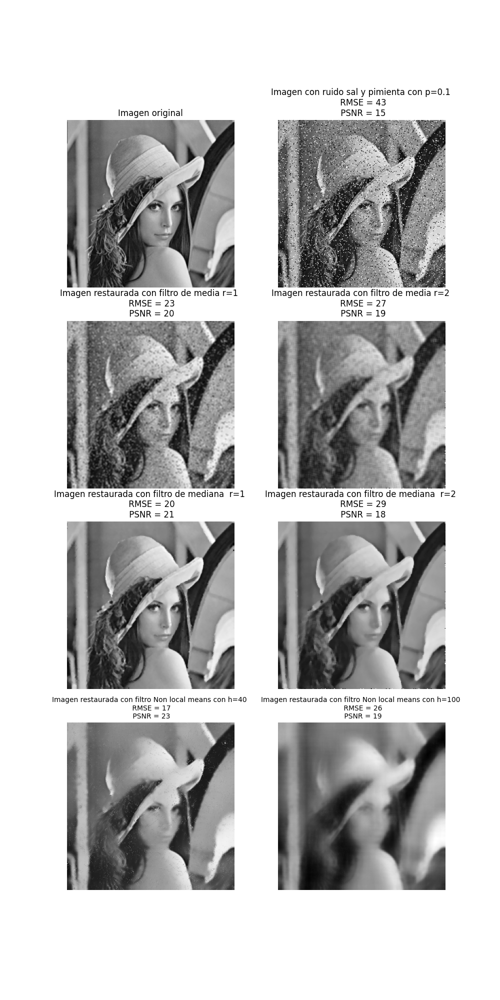

In [60]:
J=add_saltpepper_noise(imagen,0.1)
K1=meanFilter(J, 1)
K2=meanFilter(J, 2)


L1=medianFilter(J, 1)
L2=medianFilter(J, 2)


M1=denoise_nl_means((J),h=40)
M2=denoise_nl_means((J), h=100)

fig, axs = plt.subplots(4,2,figsize=(10,20))

axs[0,0].imshow(imagen,cmap="gray")
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(J,cmap="gray")
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido sal y pimienta con p=0.1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,J)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, J))))


axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen restaurada con filtro de media r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K1))))
axs[1,0].imshow(K1,cmap="gray")

axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen restaurada con filtro de media r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K2))))
axs[1,1].imshow(K2,cmap="gray")

axs[2,0].set_axis_off()
axs[2,0].set_title("Imagen restaurada con filtro de mediana  r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L1))))
axs[2,0].imshow(L1,cmap="gray")

axs[2,1].set_axis_off()
axs[2,1].set_title("Imagen restaurada con filtro de mediana  r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L2))))
axs[2,1].imshow(L2,cmap="gray")


axs[3,0].set_axis_off()
axs[3,0].set_title("Imagen restaurada con filtro Non local means con h=40 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M1))),fontsize=10)
axs[3,0].imshow(M1,cmap="gray")

axs[3,1].set_axis_off()
axs[3,1].set_title("Imagen restaurada con filtro Non local means con h=100 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M2))),fontsize=10)
axs[3,1].imshow(M2,cmap="gray")

In [ ]:
J=add_saltpepper_noise(imagen,0.01)
K1=meanFilter(J, 1)
K2=meanFilter(J, 2)


L1=medianFilter(J, 1)
L2=medianFilter(J, 2)


M1=denoise_nl_means((J), h=20)
M2=denoise_nl_means((J), h=30)

fig, axs = plt.subplots(4,2,figsize=(10,20))

axs[0,0].imshow(imagen,cmap="gray")
axs[0,0].set_axis_off()
axs[0,0].set_title("Imagen original")

axs[0,1].imshow(J,cmap="gray")
axs[0,1].set_axis_off()
axs[0,1].set_title("Imagen con ruido sal y pimienta con p=0.01 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,J)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, J))))


axs[1,0].set_axis_off()
axs[1,0].set_title("Imagen restaurada con filtro de media r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K1))))
axs[1,0].imshow(K1,cmap="gray")

axs[1,1].set_axis_off()
axs[1,1].set_title("Imagen restaurada con filtro de media r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,K2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, K2))))
axs[1,1].imshow(K2,cmap="gray")

axs[2,0].set_axis_off()
axs[2,0].set_title("Imagen restaurada con filtro de mediana  r=1 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L1))))
axs[2,0].imshow(L1,cmap="gray")

axs[2,1].set_axis_off()
axs[2,1].set_title("Imagen restaurada con filtro de mediana  r=2 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,L2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, L2))))
axs[2,1].imshow(L2,cmap="gray")


axs[3,0].set_axis_off()
axs[3,0].set_title("Imagen restaurada con filtro Non local means con h=20 \n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M1)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M1))),fontsize=10)
axs[3,0].imshow(M1,cmap="gray")

axs[3,1].set_axis_off()
axs[3,1].set_title("Imagen restaurada con filtro Non local means con h=30\n RMSE = "+str(int(np.sqrt(mean_squared_error(imagen,M2)))) +"\n PSNR = " +str(int(peak_signal_noise_ratio(imagen, M2))),fontsize=10)
axs[3,1].imshow(M2,cmap="gray")

## 4) Movimiento lineal uniforme 

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
import cv2 #opencv
import random

%matplotlib inline

**a) Ver PSF y MTF del movimiento lineal uniforme (se provee una función que calcula la PSF a partir del largo y el ángulo del movimiento)**    

Para un cierto movimiento lineal, mostrar PSF y MTF. Analizar qué forma tiene la MTF.  

Aplicar el movimiento sobre una imagen y mostrar las imágenes original y degradada y sus transformadas.

In [62]:
from skimage import transform
import numpy as np

def motionPSF(largo=9,angulo=0, sz=65):
    # Se genera una imagen cuadrada de lado sz y se pinta una linea horizontal 
    # en el medio de la imagen de tamaño igual al largo
    f = np.zeros((sz,sz)) 
    f[sz // 2, sz // 2 - largo//2 : sz // 2 + largo//2 + 1]=1  # "//" hace una división entera  
    # Luego se rota el angulo especificado
    f = transform.rotate(f,angulo);
    # Finalmente se normaliza
    f = f/np.sum(f);
    return f

In [63]:
def MoverImagen(I,largo,angulo):
    sz=65
    espectro_I_movida=fft2(I)
    #espectro_I_movida= fftshift(espectro_I_movida)

    psf=motionPSF(largo=largo,angulo=angulo)

    di=-sz/2
    dj=-sz/2
    [iF,jF]=np.meshgrid(np.arange(0,I.shape[0]),np.arange(0,I.shape[1]),indexing='ij')
    transl_F=np.exp(-1j*2*np.pi*(iF*di/I.shape[0]+jF*dj/I.shape[1]))
    mtf=fft2(psf,I.shape)*transl_F
    I_deg_fft=espectro_I_movida*mtf

    I_deg=np.abs(ifft2(I_deg_fft))
    
    return I_deg


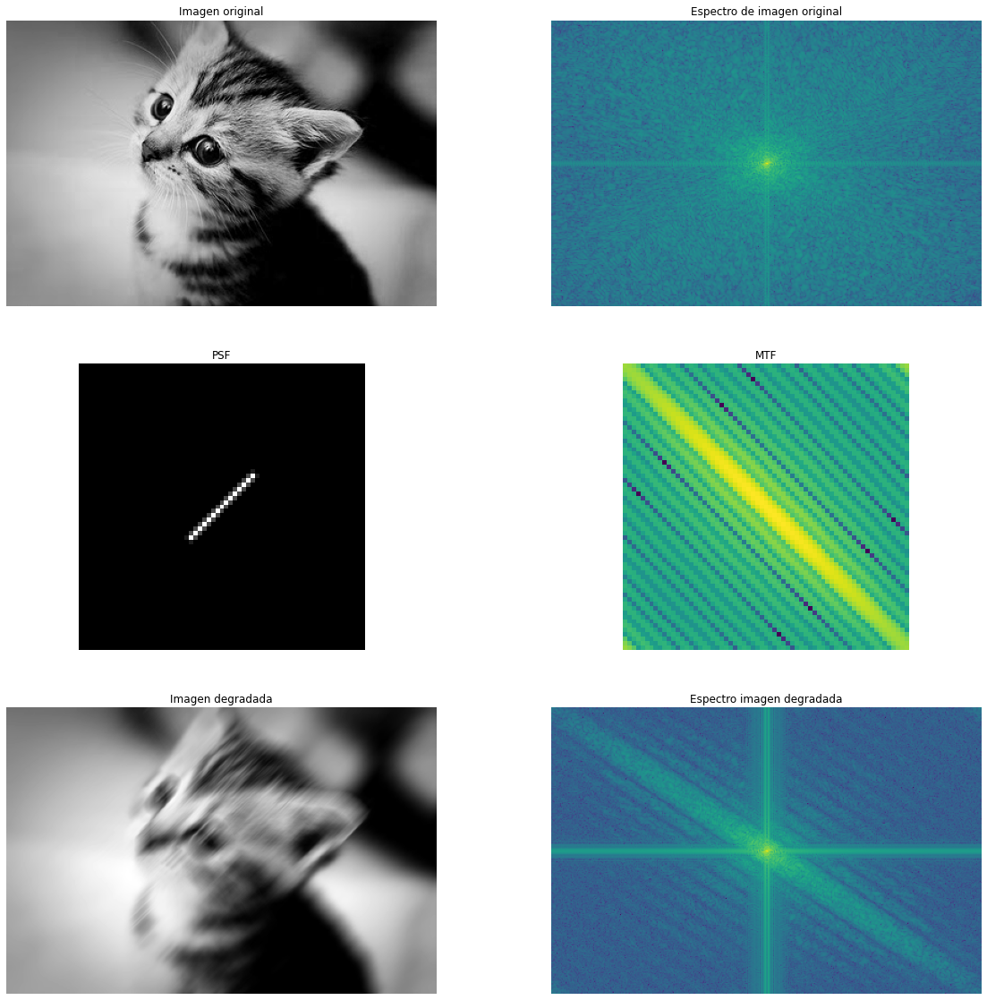

In [64]:
A = motionPSF(20, 45)
I = cv2.imread(dir_base+'kitten.jpg')
I=I[:,:,0]
I_conv=convolve(I,A)
espectro_I=fft2(I)
espectro_I=fftshift(espectro_I)

espectro_I_conv=fft2(I_conv)
espectro_I_conv=fftshift(espectro_I_conv)

espectro_A=fft2(A)
espectro_A=fftshift(espectro_A)
fig, axs = plt.subplots(3,2,figsize=(20,20))

axs[0,0].imshow(I,cmap="gray")
axs[0,0].set_title("Imagen original")
axs[0,0].set_axis_off()
axs[0,1].imshow(20*np.log10(abs(espectro_I)))
axs[0,1].set_title("Espectro de imagen original")
axs[0,1].set_axis_off()

axs[1,0].imshow(A,cmap="gray")
axs[1,0].set_title("PSF")
axs[1,0].set_axis_off()
axs[1,1].imshow(20*np.log10(abs(espectro_A)))
axs[1,1].set_title("MTF")
axs[1,1].set_axis_off()

axs[2,0].imshow(I_conv,cmap="gray")
axs[2,0].set_title("Imagen degradada")
axs[2,0].set_axis_off()
axs[2,1].imshow(20*np.log10(abs(espectro_I_conv)))
axs[2,1].set_title("Espectro imagen degradada")
axs[2,1].set_axis_off()



**b) Se busca hacer visible el número de matrícula en las imágenes blurred1.png, blurred2.png, blurred3.png.  
Intente restaurar las imágenes utilizando las siguientes técnicas:**

* Filtrado inverso (implementar)   
* Filtrado pseudo inverso (implementar)    
* Filtrado de Wiener (usar la función “wiener” del paquete skimage.restoration con diversos parámetros)

Para esta parte se midió el ángulo y el largo del movimiento con fiji y se intentó recuperar la matrícula. En los casos de las imágenes blurred2 y blurred3 se probó con valores cercanos ya que con los que se midieron no se obtuvieron buenos resultados. Se varió tambien el parámetro del filtro pseudo inverso y el parámetro de regularización del filtro de wiener.

In [65]:
def filtrado_inverso(I_movida,h,sz=65):
    """Hace el filtrado con 1/H

    Args:
        I_movida (ndarray): imagen a restaurar
        h (ndarray):PSF
    """
    espectro_I_movida=fft2(I_movida)
    espectro_I_movida=fftshift(espectro_I_movida)
    H=fft2(h, np.shape(I_movida))
    di=-sz/2
    dj=-sz/2
    [iF,jF]=np.meshgrid(np.arange(0,I.shape[0]),np.arange(0,I.shape[1]),indexing='ij')
    transl_F=np.exp(-1j*2*np.pi*(iF*di/I.shape[0]+jF*dj/I.shape[1]))
    H=H*transl_F
    H=(fftshift(H))
    G=(1/H)
    espectro_J=espectro_I_movida*G
    J=np.abs(ifft2(espectro_J))
    return(J, espectro_J, G)


def filtrado_pseudo_inverso(I_movida,h,cte,sz=65):
    """Hace el filtrado con 1/H

    Args:
        I_movida (ndarray): imagen a restaurar
        h (ndarray):PSF
    """
    espectro_I_movida=fft2(I_movida)
    espectro_I_movida=fftshift(espectro_I_movida)
    H=fft2(h, np.shape(I_movida))
    di=-sz/2
    dj=-sz/2
    [iF,jF]=np.meshgrid(np.arange(0,I.shape[0]),np.arange(0,I.shape[1]),indexing='ij')
    transl_F=np.exp(-1j*2*np.pi*(iF*di/I.shape[0]+jF*dj/I.shape[1]))
    H=H*transl_F
    H=(fftshift(H)) + cte
    G=(1/H)
    espectro_J=espectro_I_movida*G
    J=np.abs(ifft2(espectro_J))
    return(J, espectro_J, G)

(355, 628)


Text(0.5, 1.0, 'Espectro filtrado de Wiener')

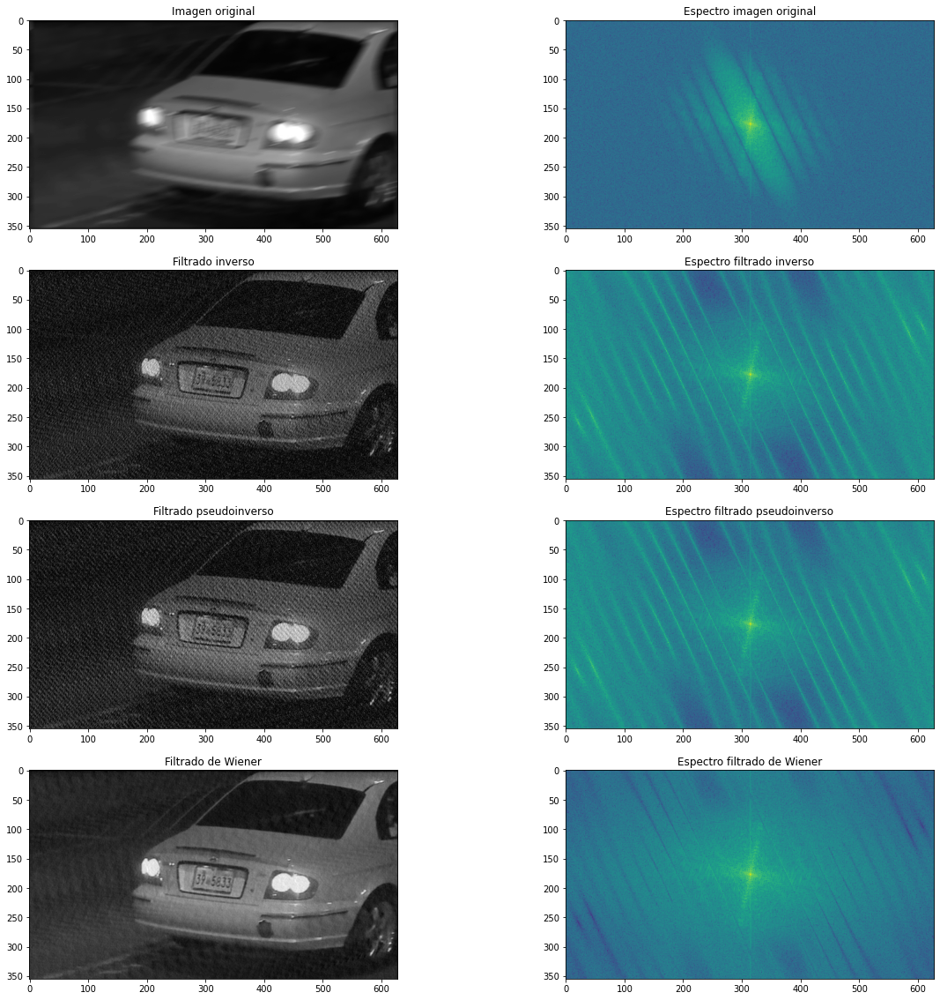

In [66]:
filenames = [dir_base+'blurred1.png']

I = cv2.imread(filenames[0])
I=I[:,:,0]
print(np.shape(I))
espectro_I=fft2(I)
espectro_I=fftshift(espectro_I)


fig, axs = plt.subplots(4,2,figsize=(20,20))
sz=100
axs[0,0].imshow(I,cmap="gray")
axs[0,1].imshow(20*np.log10(abs(espectro_I)))


A = motionPSF(20, 15, sz)
J, espectro_J, G=filtrado_inverso(I,A,sz)



axs[1,0].imshow(J,cmap="gray")
axs[1,1].imshow(20*np.log10(abs(espectro_J)))
J, espectro_J, G=filtrado_pseudo_inverso(I,A,0.001, sz)




axs[2,0].imshow(J,cmap="gray")
axs[2,1].imshow(20*np.log10(abs(espectro_J)))

J=restoration.wiener(I, A,0.0001, clip=False)

espectro_J=fft2(J)
espectro_J=fftshift(espectro_J)



axs[3,0].imshow(J,cmap="gray")
axs[3,1].imshow(20*np.log10(abs(espectro_J)))


axs[0,0].set_title("Imagen original")
axs[0,1].set_title("Espectro imagen original")
axs[1,0].set_title("Filtrado inverso")
axs[1,1].set_title("Espectro filtrado inverso")
axs[2,0].set_title("Filtrado pseudoinverso")
axs[2,1].set_title("Espectro filtrado pseudoinverso")
axs[3,0].set_title("Filtrado de Wiener")
axs[3,1].set_title("Espectro filtrado de Wiener")


Para la imagen **"blurred1"** se lee la matrícula **395833**. 

(546, 976)


Text(0.5, 1.0, 'Espectro filtrado de Wiener')

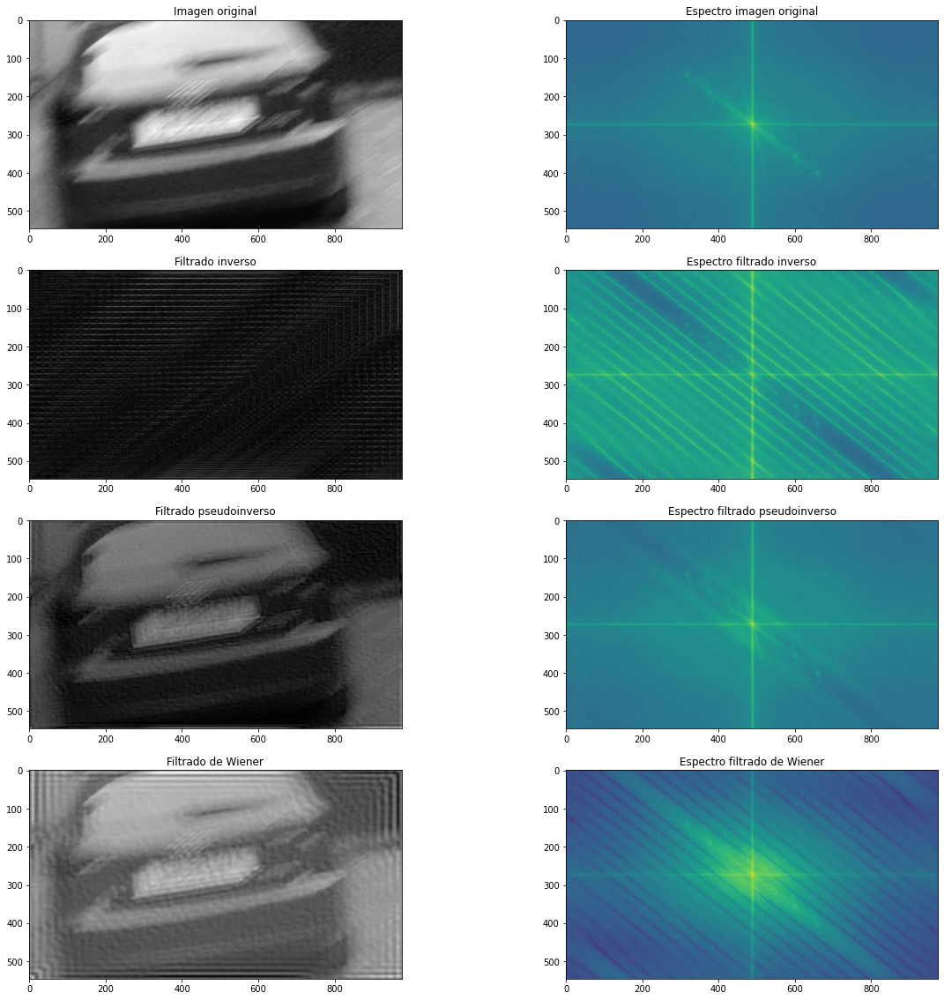

In [67]:
filenames = [dir_base+'blurred2.png']

I = cv2.imread(filenames[0])
I=I[:,:,0]
print(np.shape(I))
espectro_I=fft2(I)
espectro_I=fftshift(espectro_I)


fig, axs = plt.subplots(4,2,figsize=(20,20))
sz=100
axs[0,0].imshow(I,cmap="gray")
axs[0,1].imshow(20*np.log10(abs(espectro_I)))
A = motionPSF(24,36, sz)
J, espectro_J, G=filtrado_inverso(I,A, sz)



axs[1,0].imshow(J,cmap="gray")
axs[1,1].imshow(20*np.log10(abs(espectro_J)))

J, espectro_J, G=filtrado_pseudo_inverso(I,A,0.5,sz)




axs[2,0].imshow(J,cmap="gray")
axs[2,1].imshow(20*np.log10(abs(espectro_J)))

J=restoration.wiener(I, A,0.7, clip=False)

espectro_J=fft2(J)
espectro_J=fftshift(espectro_J)



axs[3,0].imshow(J,cmap="gray")
axs[3,1].imshow(20*np.log10(abs(espectro_J)))

axs[0,0].set_title("Imagen original")
axs[0,1].set_title("Espectro imagen original")
axs[1,0].set_title("Filtrado inverso")
axs[1,1].set_title("Espectro filtrado inverso")
axs[2,0].set_title("Filtrado pseudoinverso")
axs[2,1].set_title("Espectro filtrado pseudoinverso")
axs[3,0].set_title("Filtrado de Wiener")
axs[3,1].set_title("Espectro filtrado de Wiener")

Para la imagen **"blurred2"**  no se alcanza a leer la matrícula, aun asi se ve que hay números/letras. 

(622, 768)


Text(0.5, 1.0, 'Espectro filtrado de Wiener')

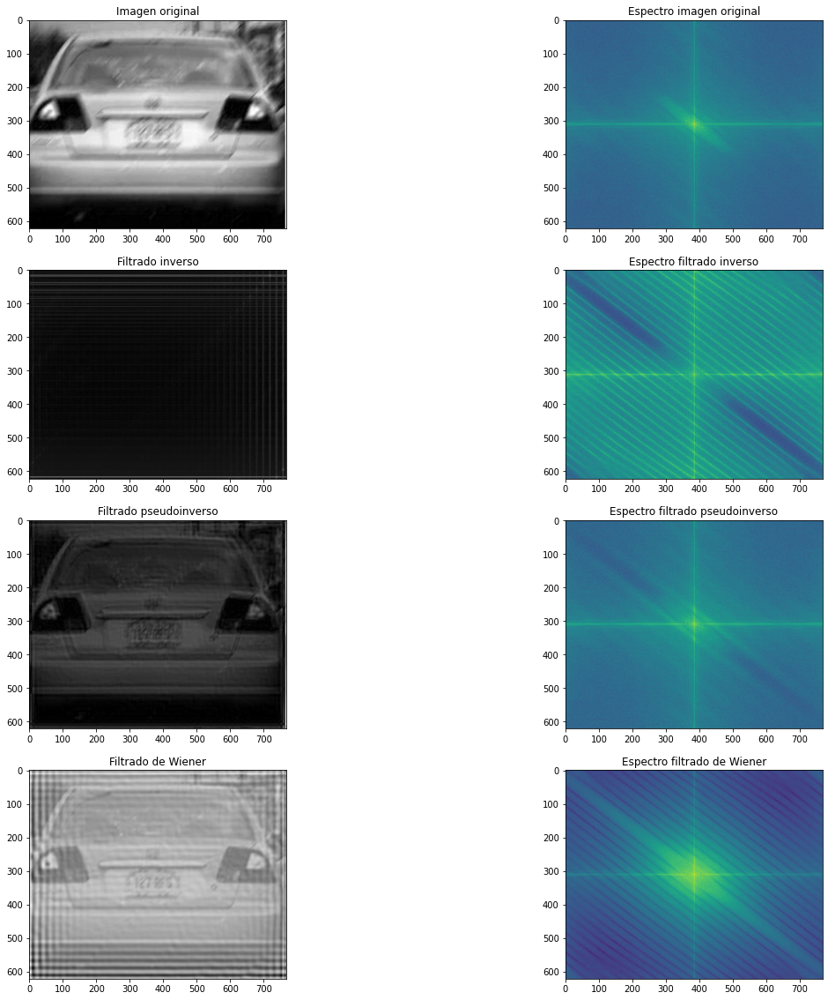

In [68]:
filenames = [dir_base+'blurred3.png']

I = cv2.imread(filenames[0])
I=I[:,:,0]
print(np.shape(I))
espectro_I=fft2(I)
espectro_I=fftshift(espectro_I)


fig, axs = plt.subplots(4,2,figsize=(20,20))
sz=100
axs[0,0].imshow(I,cmap="gray")
axs[0,1].imshow(20*np.log10(abs(espectro_I)))
A = motionPSF( 28,47, sz)

J, espectro_J, G=filtrado_inverso(I,A)



axs[1,0].imshow(J,cmap="gray")
axs[1,1].imshow(20*np.log10(abs(espectro_J)))

J, espectro_J, G=filtrado_pseudo_inverso(I,A,0.5,sz)




axs[2,0].imshow(J,cmap="gray")
axs[2,1].imshow(20*np.log10(abs(espectro_J)))

from skimage import  restoration
J=restoration.wiener(I, A,0.5, clip=False)

espectro_J=fft2(J)
espectro_J=fftshift(espectro_J)



axs[3,0].imshow(J,cmap="gray")
axs[3,1].imshow(20*np.log10(abs(espectro_J)))

axs[0,0].set_title("Imagen original")
axs[0,1].set_title("Espectro imagen original")
axs[1,0].set_title("Filtrado inverso")
axs[1,1].set_title("Espectro filtrado inverso")
axs[2,0].set_title("Filtrado pseudoinverso")
axs[2,1].set_title("Espectro filtrado pseudoinverso")
axs[3,0].set_title("Filtrado de Wiener")
axs[3,1].set_title("Espectro filtrado de Wiener")

Para la imagen **"blurred3"**  se alcanza a leer **127RF5** (o algo asi). c:

## 5) Transformada DFT

### Visualización en espacio y frecuencia    

**a)** Visualizar la imagen trapo.jpg y graficar varios perfiles (horizontal y vertical) del trapo de la imagen.   
Medir el *periodo de la onda en cada dirección*. No es necesaria una medida exhaustiva. Puede ser conveniente usar Fiji para esta tarea.

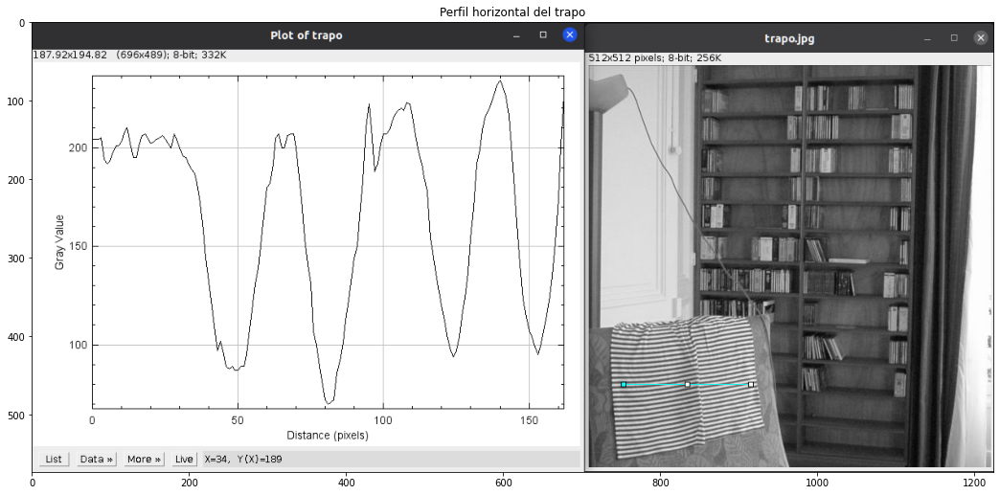

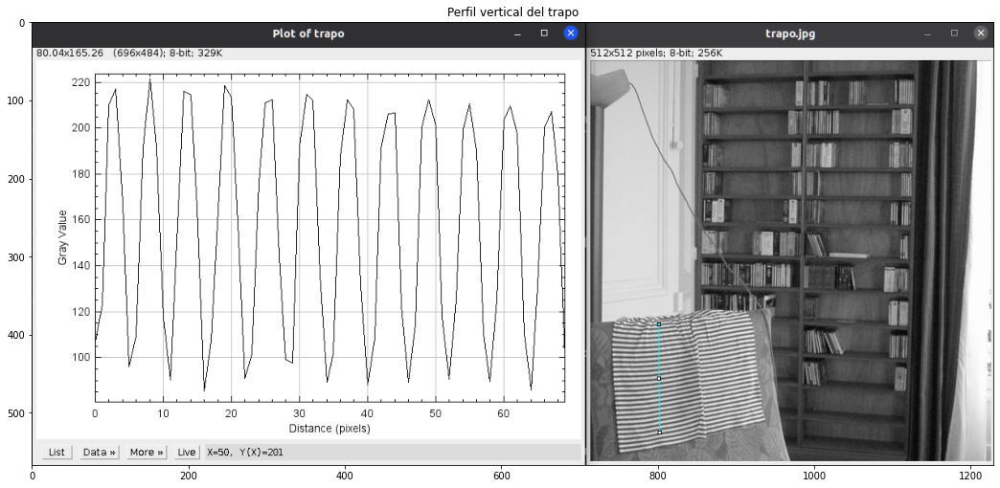

In [69]:

I = cv2.imread(dir_base+'horizontal.png')
plt.figure(figsize=(18, 18))
plt.title("Perfil horizontal del trapo")
plt.imshow(I) 
J = cv2.imread(dir_base+'trapo_vertical.png')

plt.figure(figsize=(18, 18))
plt.title("Perfil vertical del trapo")

plt.imshow(J) #u otra forma de graficar

El periodo horizontal de la onda es entre 30 y 40 pixeles.

El periodo vertical es aproximadamente de 6 pixeles.

**b)** Calcular la transformada de Fourier de la imagen y visualizar los picos espectrales. Indicar en qué frecuencias ocurren estos picos.

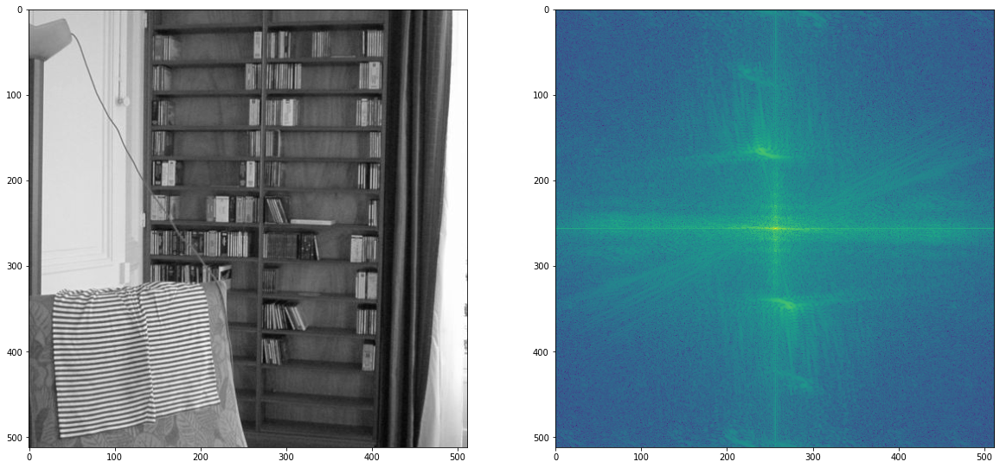

In [70]:
filenames = [dir_base+'trapo.jpg']

I = cv2.imread(filenames[0])
I=I[:,:,0]
espectro_I=fft2(I)
espectro_I=fftshift(espectro_I)


fig, axs = plt.subplots(1,2,figsize=(20,20))
sz=100
axs[0].imshow(I,cmap="gray")
axs[1].imshow(20*np.log10(abs(espectro_I)))

El pico más definido es a 80 pixeles del 0. 

**c)** Discutir la relación entre las medidas realizadas en el espacio en **(a)** y la ubicación de los picos en frecuencia en **(b)**

El perfil vertical tiene frecuencia más alta que el perfil horizontal por lo tanto se espera que los picos en frecuencia de la transformada estén más alejados de 0. Como la imagen es de 522 pixeles y el periodo vertical es de 6, se espera que el pico en frecuencia esté a 522/6, que es cercano a 80.
El perfil horizontal tiene frecuencia más baja y menos definida por lo que no se llega a distinguir los picos.  

## 6) Template matching

**a)** Diseñar un programa que detecte automáticamente cuántas veces aparece Wally en la imagen “dondeEstaWally.png”.  Se deberá implementar la comparación de al menos tres maneras diferentes:

* correlación espacial
* correlación usando la FFT
* correlación de fase ([phase correlation](https://en.wikipedia.org/wiki/Phase_correlation))

Para esa tarea se podrá usar la función **scipy.signal.convolve**. En caso de usar esta función o una similar, se explicarán los parámetros usados.


In [105]:
def correlacion_espacial(img,template, umbral):
    start = time.process_time()
    img=img-np.mean(img)
    template=template-np.mean(template)
    corr = correlate2d(img, template, boundary='symm', mode='same') 
    lista = corr.flatten()
    indices = [i for i, x in enumerate(lista) if x > umbral]
    indices_matriz = np.unravel_index(indices, np.shape(corr))
    print("tiempo espacial", time.process_time() - start)
    plt.figure(figsize=(10, 10))
    plt.imshow(corr,cmap='gray' ) 
    plt.title("Correlación espacial")
    plt.figure(figsize=(10, 10))
    counts, bin_edges= np.histogram(corr, 350000)
    plt.stairs(counts, bin_edges )
    plt.title("Histograma correlación espacial")   
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img, cmap='gray')
    for i in range(np.shape(indices_matriz)[1]):
        centro = (indices_matriz[1][i], indices_matriz[0][i])
        rectangulo = patches.Rectangle((centro[0]-(template.shape[1]-1)/2, centro[1]-(template.shape[0]-1)/2), template.shape[1], template.shape[0], linewidth=1, edgecolor='r', facecolor='none')    
        ax.add_patch(rectangulo)
    plt.show()

    
def correlacion_fft(img, template, umbral):
    start = time.process_time()

    img=img-np.mean(img)
    template=template-np.mean(template)

    Ga = fft2(img)
    Gb = fft2(template, np.shape(img))
    corr = np.abs(np.fft.ifft2((Ga*np.conj(Gb))))
    lista = corr.flatten()
    indices = [i for i, x in enumerate(lista) if x > umbral]
    indices_matriz = np.unravel_index(indices, np.shape(corr))
    print("tiempo fft",time.process_time() - start)
    plt.figure(figsize=(10, 10))
    plt.imshow(corr,cmap='gray' ) 
    plt.title("Correlación fft")
    plt.figure(figsize=(10, 10))
    counts, bin_edges= np.histogram(corr, 350000)
    plt.stairs(counts, bin_edges )
    plt.title("Histograma correlación fft")   
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img, cmap='gray')
    for i in range(np.shape(indices_matriz)[1]):
        centro = (indices_matriz[1][i], indices_matriz[0][i])
        rectangulo = patches.Rectangle((centro[0], centro[1]), template.shape[1], template.shape[0], linewidth=1, edgecolor='r', facecolor='none')    
        ax.add_patch(rectangulo)
    plt.show()
    


def correlacion_fase(img, template, umbral):
    start = time.process_time()
    img=img-np.mean(img)
    template=template-np.mean(template)
    Ga = fft2(img)
    Gb = fft2(template, np.shape(img))
    c = np.abs(np.fft.ifft2((Ga*np.conj(Gb))/np.abs(Ga*np.conj(Gb)))) 
    lista = c.flatten()
    indices = [i for i, x in enumerate(lista) if x > umbral]
    indices_matriz = np.unravel_index(indices, np.shape(c))
    print(time.process_time() - start)
    plt.figure(figsize=(10, 10))
    plt.imshow(c,cmap='gray' ) 
    plt.title("Correlación fase")  
    plt.figure(figsize=(10, 10))
    counts, bin_edges= np.histogram(c, 350000)
    plt.stairs(counts, bin_edges )
    plt.title("Histograma Correlación fase")   
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img, cmap='gray')
    for i in range(np.shape(indices_matriz)[1]):
        centro = (indices_matriz[1][i], indices_matriz[0][i])
        rectangulo = patches.Rectangle((centro[0], centro[1]), template.shape[1], template.shape[0], linewidth=1, edgecolor='r', facecolor='none')    
        ax.add_patch(rectangulo)

    # Mostramos el gráfico
    plt.show()



**b)** Comparar los resultados y los tiempos insumidos por los distintos métodos

In [106]:


template = imread(dir_base+'Wally_template.png')
if template.ndim>2:
    template = template[:,:,0]
    
img = imread(dir_base+'dondeEstaWally.png')
if img.ndim>2:
    img = img[:,:,0]

tiempo espacial 3.8252978069999983


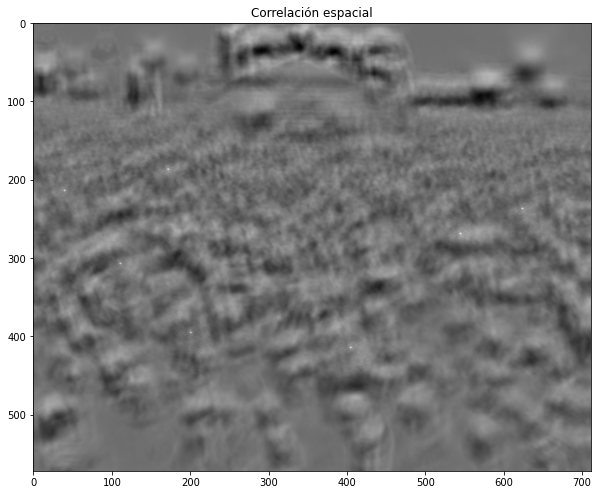

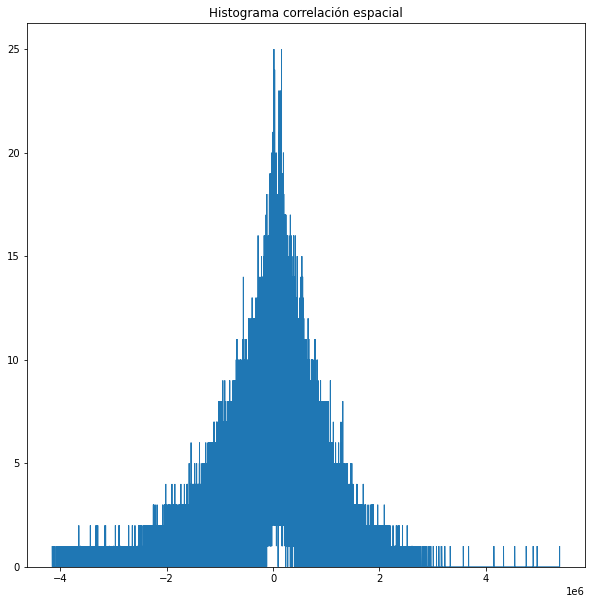

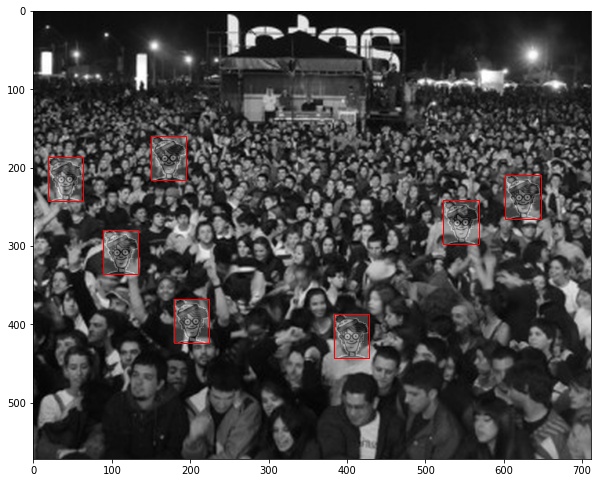

In [107]:
correlacion_espacial(img,template, 4000000)

tiempo fft 0.17380400199999713


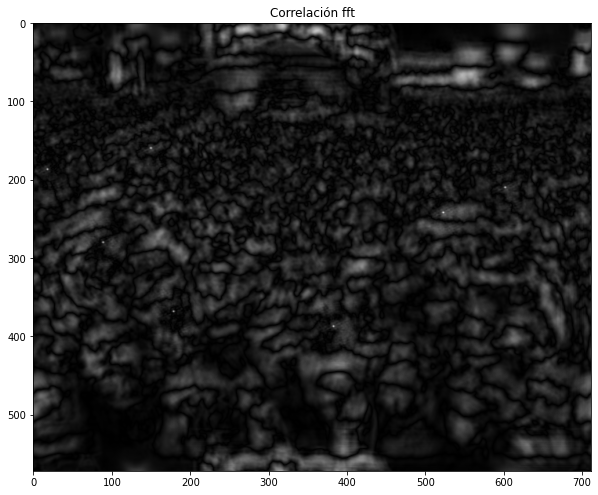

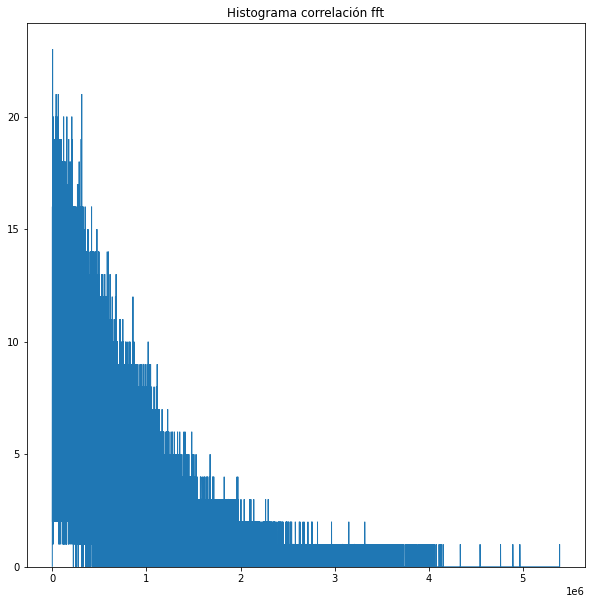

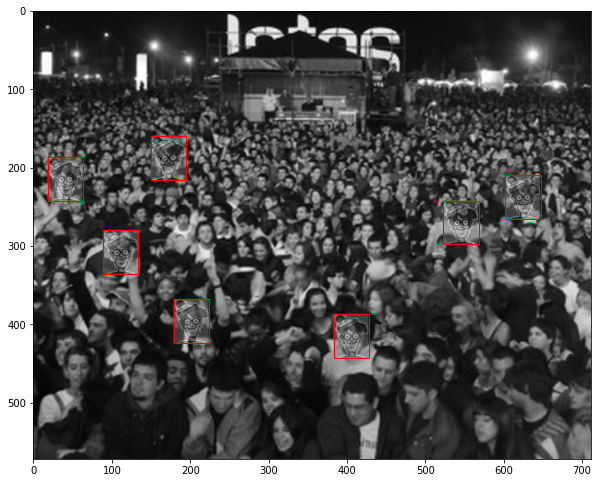

In [108]:
correlacion_fft(img,template,4154000)

0.18674092099999484


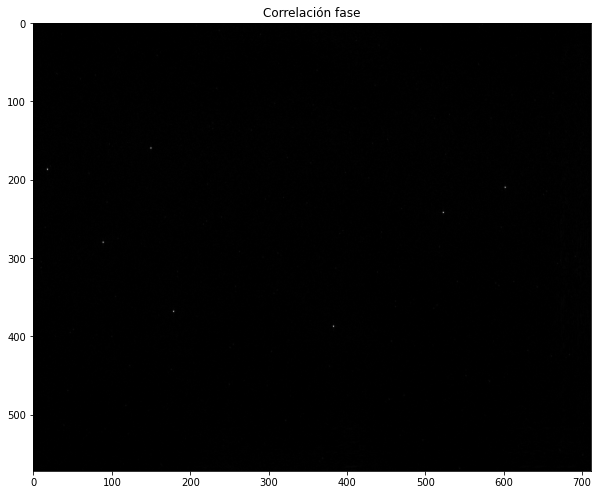

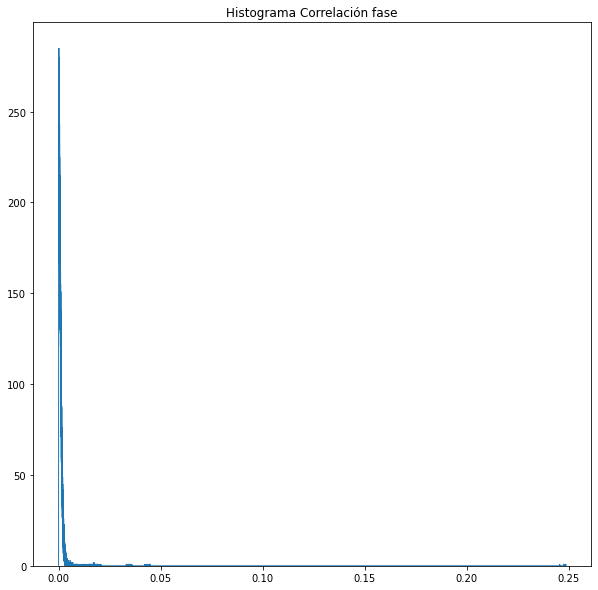

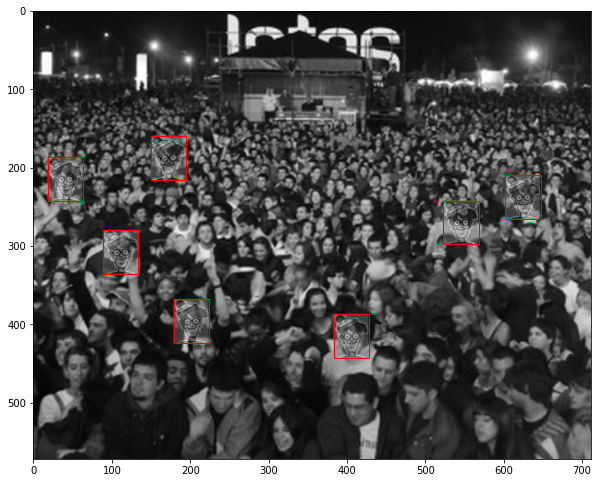

In [109]:
correlacion_fase(img,template,0.2)

En los tres casos se logra encontrar los Wallys c: Para elegir el umbral se fue probando mirando los histogramas de la correlación.

El de correción espacial es el que demora más tiempo, pero el más fácil de implementar. El de fft es el más rápido y le sigue el de fase, no tienen tanta diferencia en el tiempo. Tal vez sea más relevate con más cantidad de imágenes o imágenes más grandes. Mirando las matrices de correlación, se observa que el método más efectivo es el de la correlación de fase, se logra distinguir muy bien los puntos en donde la correlación es más alta. 